<h1 style="font-size:2.0rem; color:green;"> Climatological averages using ESA CCI data, ESA CCI gap-filled data, LMDZ-ORCHIDEE_35km data, ERA_LAND_9km data scf_ERA5_25km data, and scf_HighResMIP_Atlas_1950_2014 data  </h1>  

<h1 style="font-size:2rem; color:green;"> Load required libraries </h1> 

In [1]:
# To reload external files automatically (ex: utils)
%load_ext autoreload
%autoreload 2  

import numpy as np
import pandas as pd
import netCDF4 as nc
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy     
from cartopy.feature import NaturalEarthFeature
import cartopy.crs as ccrs 
import cartopy.feature as cf
from cartopy.util import add_cyclic_point
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

<h1 style="font-size:2rem; color:green;"> For parallelisation  </h1> 

In [2]:
from dask.distributed import Client
client = Client(n_workers=16, threads_per_worker=2, memory_limit='32GB')
client

/home/hamid/anaconda3/envs/first_part/lib/python3.10/site-packages/distributed/node.py:182: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 39451 instead
  warnings.warn(
2023-05-15 15:30:04,879 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 32GB due to system memory limit of 15.32 GiB
2023-05-15 15:30:04,881 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 32GB due to system memory limit of 15.32 GiB
2023-05-15 15:30:04,885 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 32GB due to system memory limit of 15.32 GiB
2023-05-15 15:30:04,887 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 32GB due to system memory limit of 15.32 GiB
2023-05-15 15:30:04,891 - distributed.nanny.memory - WARNING - Ignoring provided memory limit 32GB due to system memory limit of 15.32 GiB
2023-05-15 15:30:04,894 - distributed.nanny.memory - WARNING - I

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:39451/status,
Dashboard: http://127.0.0.1:39451/status,Workers: 16
Total threads: 32,Total memory: 245.10 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:38959,Workers: 16
Dashboard: http://127.0.0.1:39451/status,Total threads: 32
Started: Just now,Total memory: 245.10 GiB
Comm: tcp://127.0.0.1:44657,Total threads: 2
Dashboard: http://127.0.0.1:39491/status,Memory: 15.32 GiB
Nanny: tcp://127.0.0.1:36859,


<h1 style="font-size:2rem; color:green;"> Set variables  </h1> 

In [3]:
# Set the value of threshold that has been used to deduce number of days with snow from scf, it was used also as a 
# constraint while computing monthly values of scf.  
threshold = '0' # <=> threshold% 

period = slice('1982-01-01', '2014-12-31')
wet_months_labels = ["JAN","FEB","MAR","APR","NOV","DEC"]
dry_months_labels = ["MAY","JUN","JUL","AUG","SEP","OCT"]
months_key = ['wet','dry']
months_labels = {'wet':wet_months_labels,'dry':dry_months_labels}
latlim = slice(30,34.5)
lonlim = slice(-10, -2)
products_labels=["ESA_ORIG","ESA_GF","ERA_LAND", "SIM_35km","ERA5","SIM_50km"]
# Setting input data directory path 
path_model_data = '/home/hamid/Data/snow/scfg/Models/Modified_data/monthly_valyes_regrided_50km/monthly_values_threshold_'+threshold  
path_esa_data = '/home/hamid/Data/snow/scfg/Satellite/ESA CCI/modified_data/monthly_valyes_regrided_50km/monthly_values_threshold_'+threshold 
path_era_land = '/home/hamid/Data/snow/scfg/Reanalysis/modified_data/monthly_valyes_regrided_50km/ERA5-LAND/monthly_values_threshold_'+threshold 
path_era5 = '/home/hamid/Data/snow/scfg/Reanalysis/modified_data/monthly_valyes_regrided_50km/ERA5/monthly_values_threshold_'+threshold

# Setting output figures directory path. 
output_path_figures = '/home/hamid/PHD-mountain-climate/First_Part/Results/figures/maps/v1/means/threshold_'+threshold

# Setting parameters names 
parameters = ["scf_monthly_value_15","ext_days_with_snow_15"]

suptitles = {"scf_monthly_value":"scf monthly value", "scf_monthly_value_15":'scf monthly value with the constraint 15 days missing days',"days_with_snow":'days with snow', "days_with_snow_15":'days with snow with the constraint 15 days missing days', "ext_days_with_snow":'extrapolated days with snow', "ext_days_with_snow_15":' extrapolated days with snow with snow with the constraint 15 days missing days'}
mon_days = {'wet':[31,28,31,30,30,31],'dry':[31,30,31,31,30,31]}
months = {'wet':[1,2,3,4,11,12],'dry':[5,6,7,8,9,10]}

leg_title = 'Snow cover fraction in %'
max_leg = 60
min_leg = 0

<h1 style="font-size:2rem; color:green;"> Importing and preparing data</h1>

In [4]:
scf_monthly_values_esa_orig = xr.open_dataset(path_esa_data +'/ESA_CCI_ORIG_variables_monthly_values_threshold_'+threshold+'.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
scf_monthly_values_esa_gf = xr.open_dataset(path_esa_data +'/ESA_CCI_GF_variables_monthly_values_threshold_'+threshold+'.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
scf_monthly_values_high_res_mip_50km = xr.open_dataset(path_model_data +'/scf_HighResMIP_Atlas_variables_monthly_values_threshold_'+threshold+'.nc').sel(lat=latlim, lon=lonlim).sel(time=period).load()
scf_monthly_values_era5 = xr.open_dataset(path_era5 +'/scf_ERA5_variables_monthly_values_threshold_'+threshold+'.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
scf_era_land_9km = xr.open_dataset(path_era_land +'/scf_ERA_Land_variables_monthly_values_threshold_'+threshold+'.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()
scf_monthly_values_lmdz_saloua_35km = xr.open_dataset(path_model_data +'/scf_lmdz_variables_monthly_values_threshold_'+threshold+'.nc').sel(time=period).sel(lat=latlim, lon=lonlim).load()

<div class="alert alert-block alert-success"; background-color:red> We put the datasets in a dictionary, each dataset with a key </div> 

In [5]:
monthly_values = {"ESA_ORIG":scf_monthly_values_esa_orig,"ESA_GF":scf_monthly_values_esa_gf,"ERA_LAND": scf_era_land_9km, "SIM_35km":scf_monthly_values_lmdz_saloua_35km,"ERA5":scf_monthly_values_era5,"SIM_50km":scf_monthly_values_high_res_mip_50km}

<div class="alert alert-block alert-success"; background-color:red> There are 5 missing dates in the time dimension of the
    data scf_monthly_values_esa_orig, we will add these dates and assign them nan values </div> 

In [6]:
"""
We detect missing dates by applying the difference function between a complete dataset and the dataset that is not
complete  
"""
missing_dates = set(monthly_values['ESA_GF'].time.values).difference(set(monthly_values['ESA_ORIG'].time.values))
missing_dates = list(missing_dates)   

# Then we convert the list of missing date to warray dataarray 
missing_date_ds = xr.DataArray(missing_dates, dims=["time"], coords=[missing_dates])

# We constract a dataaray of the whole dates period  
full_dates = xr.concat([scf_monthly_values_esa_orig.time, missing_date_ds], dim="time")

# We reindex the original dataset and fill empty values with nan
scf_monthly_values_esa_orig = scf_monthly_values_esa_orig.reindex(time=full_dates, fill_value=np.nan).sortby("time")

<h1 style="font-size:2rem; color:green;"> The monthly climatological averages </h1>

In [7]:
# We define a dictionnary that will contain the five datasets of monthly averages of all above-mentioned variables 
monthly_values_basic_mean = {prod:'a' for prod in products_labels}

In [8]:
# We compute the averages off all variables for all datasets 
for prod in products_labels:   
    monthly_values_basic_mean[prod] = monthly_values[prod].groupby('time.month').mean(dim='time')

In [9]:
# We store the results      
#for key in keys_dic:
 #   monthly_values_basic_mean[key].to_netcdf(output_path + '/based_monthly_averages/'+key+'_based_average.nc')                               

In [10]:
spatial_monthly_values = {par:{key1:{key2:{key3:'value' for key3 in products_labels} for key2 in months[key1]} for key1 in months_key} for par in parameters}

In [11]:
for par in parameters:
    for key1 in months_key:
        for mon in months[key1]:
            for prod in products_labels:
                spatial_monthly_values[par][key1][mon][prod] = monthly_values_basic_mean[prod][par].loc[{'month':mon}].mean(dim=['lat','lon']).values

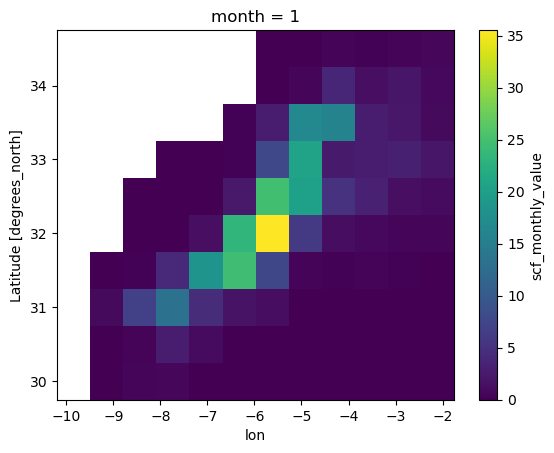

In [12]:
# Checking data 
monthly_values_basic_mean['ERA_LAND'].loc[{'month':1}]['scf_monthly_value'].plot()

<h1 style="font-size:2rem; color:green;"> Compare, climatologies plots </h1> 

<div class="alert alert-block alert-success"; background-color:red> We define the formatting function of the figures </div> 

In [13]:
# This auxiliary function will help us in the formatting of the figures
def set_size(w,h, ax=None):
    """ w, h: width, height in inches """
    if not ax: ax=plt.gca()
    l = ax.figure.subplotpars.left
    r = ax.figure.subplotpars.right
    t = ax.figure.subplotpars.top
    b = ax.figure.subplotpars.bottom
    figw = float(w)/(r-l)
    figh = float(h)/(t-b)
    ax.figure.set_size_inches(figw, figh)

<div class="alert alert-block alert-success"; background-color:red> We personalize the colorbar </div> 

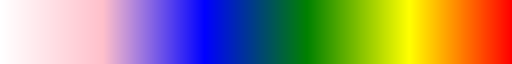

In [14]:
import matplotlib as mpl
def colorFader(c1,c2,mix=0): #fade (linear interpolate) from color c1 (at mix=0) to c2 (mix=1)
    c1=np.array(mpl.colors.to_rgb(c1))
    c2=np.array(mpl.colors.to_rgb(c2))
    return mpl.colors.to_hex((1-mix)*c1 + mix*c2)

c0='white'
c1='pink' 
c2='blue' 
c3='green' 
c4='yellow' 
c5='red' 

n=250

colors0 = []
colors1 = []
colors2 = []
colors3 = []
colors4 = []
for x in range(n+1):
    colors0.append(colorFader(c0,c1,x/n))
    colors1.append(colorFader(c1,c2,x/n))
    colors2.append(colorFader(c2,c3,x/n))
    colors3.append(colorFader(c3,c4,x/n))
    colors4.append(colorFader(c4,c5,x/n))

colors = colors0 + colors1 + colors2 + colors3 + colors4

cmap_init = mpl.colors.ListedColormap(colors)
cmap_init

In [15]:
# Put products in descending order based on spatial resolution
keys_dic=['SIM_50km', 'SIM_35km','ERA5', 'ERA_LAND', 'ESA_ORIG', 'ESA_GF']

In [16]:
statios_colors = ["darkgreen","orange", "lemonchiffon","khaki", "palegoldenrod","darkblue"]
# We define stations labels and coordinates to be ploted on the map
lats = np.array([33.5,32.67,31.53,31.50,31.56,31.20,36])
lons = np.array([-5.16,-4.74,-6.30,-6.45,-6.29,-7.86, -9.8])
names = [" IFR", " MID", "", "TIC,MGN,TIZ", "", " OUK", 'spatial_mean_value']  


for ikey_mon, key_mon in enumerate(['wet','dry']):
    if key_mon == 'dry':  
        max_leg = 60
        min_leg = 0 
        leg_title = 'Snow cover fraction in %' 
        
    # For each parameter, we plot a figure
    for ipar,par in enumerate(parameters):   
        
        if ipar==1: # That mean, when we finish with snow fraction mean, we move to number of days with snow, 
            # some constants will change 
            max_leg = 31
            min_leg = 0
            leg_title = 'number of days/month'
        
        # Define the figure and each axis for the 3 rows and 3 columns
        fig, axs = plt.subplots(nrows=6,ncols=6,
                        subplot_kw={'projection': ccrs.PlateCarree()}, dpi=600) #   figsize=(11,8.5)
        # Formatting figure 
        plt.subplots_adjust(wspace=0.10,hspace=0.08)
        set_size(14,12)      
        # Axs is a 2 dimensional array of `GeoAxes`.  We will flatten it into a 1-D array as follow 
        axs=axs.flatten()

        
        i_ax=0 
        for imon,mon in enumerate(months[key_mon]): 
            for ipord,prod in enumerate(keys_dic):  
                if ipar == 0:
                    names[6] = 'scf_SM = '+str(np.round(spatial_monthly_values[par][key_mon][mon][prod],2))+'%'
                else:
                    names[6] = 'N°_days_SM='+str(np.round(spatial_monthly_values[par][key_mon][mon][prod],2))+'days'
                
                # Select the data of month mon and of produc
                data = monthly_values_basic_mean[prod].loc[{'month':mon}][par]
        
                # Plot climatological mean 
                cs = data.plot(ax=axs[i_ax], cmap=cmap_init , add_colorbar=False, vmin=min_leg, 
                               vmax=max_leg, add_labels=False)
        
                axs[i_ax].add_feature(cf.NaturalEarthFeature('physical', 'ocean', '50m', edgecolor='face', 
                                                             facecolor='cyan'))
                axs[i_ax].set_extent([ -10, -2, 30, 37])
                
                # Pointing the stations on one of the boxplots
                #if ['ESA_GF','ESA_ORIG'].count(key):
                axs[i_ax].scatter(lons, lats, 15, color='black', marker=".", edgecolor='black')
                for j in range(len(names)):
                    axs[i_ax].text(lons[j], lats[j], names[j], va="top", family="monospace", weight="bold", 
                                   fontsize=7, color='black')

                # Draw the coastines for each subplot
                axs[i_ax].coastlines()
                                                                                            
                i_ax=i_ax+1
                
        k=0
        for i_ax in range(0,31,6):
            axs[i_ax].set_ylabel(months_labels[key_mon][k],  fontsize=18)
            k=k+1
    
        for i_ax in range(6):
            axs[i_ax].set_title(keys_dic[i_ax]+'\n',  fontsize=18)
    
        # Longitude labels
        for i in range(30,36):
            axs[i].set_xticks(np.arange(-10,-2,3), crs=ccrs.PlateCarree())
            lon_formatter = LongitudeFormatter()
            axs[i].xaxis.set_major_formatter(lon_formatter)

        # Latitude labels
        for i in [0,6,12,18,24,30]:
            axs[i].set_yticks(np.arange(30,37,2), crs=ccrs.PlateCarree())
            lat_formatter = LatitudeFormatter()
            axs[i].yaxis.set_major_formatter(lat_formatter)
       
        # Add a colorbar axis at the bottom of the graph
        cbar_ax = fig.add_axes([0.15, 0.06, 0.73, 0.02])

        # Draw the colorbar   
        fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init , label=leg_title, ticks=[val for val in range(min_leg,max_leg,3)], orientation='horizontal') 
        
        # Title
        #fig.suptitle(suptitles[par]+' '+key_mon+' months', fontsize=26)
        
        # Store figures 
        # plt.savefig(output_path_figures+'/'+par+'_'+key_mon+'_months_threshold_'+threshold+'_months_average_with_ERA5.pdf')
        # plt.savefig(output_path_figures+'/'+par+'_'+key_mon+'_months_threshold_'+threshold+'_months_average_with_ERA5.png')

/tmp/ipykernel_197125/2736526541.py:88: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init , label=leg_title, ticks=[val for val in range(min_leg,max_leg,3)], orientation='horizontal')
/tmp/ipykernel_197125/2736526541.py:88: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  fig.colorbar(cs, cax=cbar_ax, cmap=cmap_init , label=leg_title, ticks=[val for val in range(min_leg,max_leg,3)], orientation='horizontal')
/tmp/ipykernel_197125/2736526541.py:88: MatplotlibDeprecationWarning: The 'cmap' parameter to Colorbar has no effect because it is overridden by the mappable; it is deprecated since 3.3 and will be removed two minor releases later.
  fig.colorbar(cs, cax